---
## 1.Exploratory Data Analysis

### 1.1 Importaciones necesarias

In [1]:
# Gestión y extracción de archivos
import os
import pandas as pd
import numpy as np
import random
import zipfile
import shutil
from tensorflow.keras.utils import image_dataset_from_directory

# Visualización de imágenes
from skimage import io
import matplotlib.pyplot as plt
import seaborn as sns

# Red neuronal
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.densenet import DenseNet121 
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
from tensorflow.keras.models import Model 
from keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dropout, Dense, Flatten, Conv2D, MaxPool2D, PReLU
from tensorflow.keras.layers import ZeroPadding2D, Convolution2D, MaxPooling2D
from tensorflow.keras.metrics import Recall
from tensorflow.keras.utils import get_custom_objects
from tensorflow.keras.initializers import GlorotUniform

# Ajuste de hiperparámetros
import keras_tuner as kt
import visualkeras

# Evaluación de resultados
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import classification_report

In [2]:
%matplotlib inline


---
### 1.2 Selección de artistas y preprocesamiento
El dataset utilizado para el proyecto fue descargado de [Kaggle](https://www.kaggle.com/ikarus777/best-artworks-of-all-time) y contiene pinturas de 50 pintores internacionales, con un total de 8.446 cuadros.  
Las obras presentes difieren mucho entre sí tanto en tamaño como en color y estilo.

In [3]:
artists = pd.read_csv('dataset/artists.csv')

In [4]:
# Ordenar el dataframe de artistas por número de cuadros
artists = artists.sort_values(by=['paintings'], ascending=False)

# Crear un nuevo dataframe artists_top con los autores que tienen más de 200 cuadros
artists_top = artists[artists['paintings'] >= 200].reset_index() 
artists_top = artists_top[['name', 'paintings']]

In [5]:
artists_top

,name,paintings
0,Vincent van Gogh,877
1,Edgar Degas,702
2,Pablo Picasso,439
3,Pierre-Auguste Renoir,336
4,Albrecht Dürer,328
5,Paul Gauguin,311
6,Francisco Goya,291
7,Rembrandt,262
8,Alfred Sisley,259
9,Titian,255


In [6]:
# Nombres de los artistas (reemplazando espacios por guiones bajos)
artist_names = [p.replace(' ', '_') for p in artists_top.name]

# Número de clases (artistas distintos)
num_classes = len(artist_names)

In [7]:
print('Número de pintores en el conjunto de entrenamiento: ',
      str(len(sorted(os.listdir('data/Train/')))))
print('\nNúmero de pintores en el conjunto de prueba: ',
      str(len(sorted(os.listdir('data/Test/')))))

Número de pintores en el conjunto de entrenamiento:  10

Número de pintores en el conjunto de prueba:  10


---
### 1.3 Carga de datos


En esta sección se define una función para cargar las imágenes del dataset de forma estructurada. Durante la carga, las imágenes se redimensionan a un tamaño uniforme de **224×224 píxeles**, lo que facilita su procesamiento posterior por las redes neuronales.  
Los datos se agrupan en *batches* de tamaño **64**, y se reserva un **10%** del conjunto de entrenamiento para validación mediante el parámetro `validation_split`.


In [8]:
def import_data(train_path, test_path, img_size=(224, 224), batch_size=64,
                val_split=0.1):
    """
    Importa las imágenes para los conjuntos de entrenamiento, validación y prueba
    utilizando la función image_dataset_from_directory de Keras.

    :param tuple img_size: tamaño al que se redimensionarán las imágenes
    :param int batch_size: tamaño de los lotes (batches) para los conjuntos
    :param float val_split: proporción del conjunto de entrenamiento reservada para validación
    :param str train_path: ruta de la carpeta que contiene las imágenes de entrenamiento
    :param str test_path: ruta de la carpeta que contiene las imágenes de prueba
    """
    
    print('=========== CONJUNTO DE TRAINING ===========')
    train_set = keras.preprocessing.image_dataset_from_directory(
        train_path,
        image_size=img_size,
        color_mode='rgb',
        batch_size=batch_size,
        label_mode='categorical',
        shuffle=True,
        validation_split=val_split,
        subset='training',
        seed=1)

    print('\n\n=========== CONJUNTO DE VALIDACIÓN ===========')
    val_set = keras.preprocessing.image_dataset_from_directory(
        train_path,
        image_size=img_size,
        color_mode='rgb',
        batch_size=batch_size,
        label_mode='categorical',
        shuffle=True,
        validation_split=val_split,
        subset='validation',
        seed=1)

    print('\n\n=========== CONJUNTO DE TEST ===========')
    test_set = keras.preprocessing.image_dataset_from_directory(
        test_path,
        image_size=img_size,
        color_mode='rgb',
        batch_size=batch_size,
        label_mode='categorical',
        shuffle=False,
        seed=1)

    return train_set, val_set, test_set

In [9]:
train_set, val_set, test_set = import_data(train_path = "data/" + "Train",
                                           test_path = "data/" + "Test")

=========== CONJUNTO DE TRAINING ===========
Found 3178 files belonging to 10 classes.
Using 2861 files for training.


=========== CONJUNTO DE VALIDACIÓN ===========
Found 3178 files belonging to 10 classes.
Using 317 files for validation.


=========== CONJUNTO DE TEST ===========
Found 793 files belonging to 10 classes.


In [10]:
# Inspección de las dimensiones de los elementos del dataset
train_set.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 10), dtype=tf.float32, name=None))

---
## 2. Detección de características con ORB

En esta sección se aplica el algoritmo ORB (Oriented FAST and Rotated BRIEF) para detectar y describir puntos clave en las obras del dataset.

ORB es un detector y descriptor eficiente y robusto frente a cambios de escala, rotación y condiciones de iluminación. Su uso es habitual en tareas de reconocimiento de patrones, emparejamiento de imágenes o reconstrucción visual.

El objetivo de esta sección es observar cómo responde este algoritmo a distintos estilos pictóricos, donde las texturas, los trazos o el nivel de detalle varían notablemente entre autores.



1. **Imports y semillas**  
   - Se importan OpenCV, os, random, numpy y matplotlib para procesamiento de imágenes, navegación de ficheros, aleatoriedad y visualización.  
   - Fijamos `random.seed(42)` y `np.random.seed(42)` para garantizar resultados reproducibles.

2. **Funciones auxiliares**  
   - `detect_and_compute(detector, image_path)`:  
     1. Carga la imagen desde `image_path`.  
     2. Convierte a escala de grises.  
     3. Detecta keypoints y calcula descriptores con el detector proporcionado.  
   - `draw_keypoints(detector, image_path, max_keypoints)`:  
     1. Llama a `detect_and_compute`.  
     2. Ordena los keypoints por fuerza de respuesta (`response`) y selecciona los `max_keypoints` mejores.  
     3. Dibuja los puntos usando `cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.  
     4. Muestra la imagen con los keypoints sobreimpresos.  
   - `draw_matches(detector, img1_path, img2_path, nmatches)`:  
     1. Obtiene keypoints y descriptores de dos imágenes.  
     2. Crea un `BFMatcher` con norma Hamming y `crossCheck=True`.  
     3. Ordena las coincidencias (`matches`) por distancia y selecciona las `nmatches` mejores.  
     4. Dibuja y muestra los emparejamientos top.

3. **Configuración del detector**  
   - `orb_detector = cv2.ORB_create(nfeatures=1000)`: inicializa ORB con hasta 1000 características.

4. **Selección aleatoria de ejemplos**  
   - Lista los artistas disponibles en `data/Train`.  
   - Elige dos artistas distintos de forma aleatoria.  
   - De cada carpeta de artista, selecciona una imagen aleatoria.

5. **Ejecución y visualización**  
   - Llama a `draw_keypoints` para cada imagen seleccionada, mostrando sus keypoints más relevantes.  
   - Llama a `draw_matches` para comparar y visualizar las mejores 30 coincidencias entre ambas imágenes.


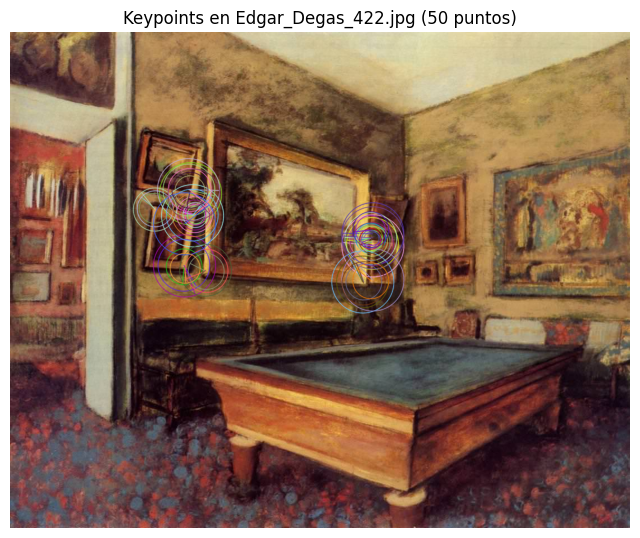

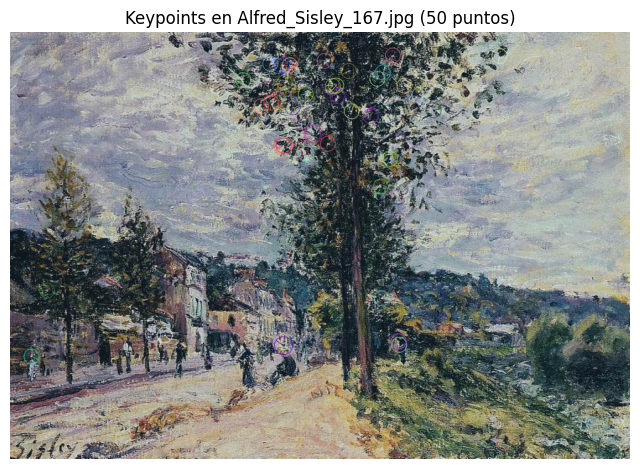

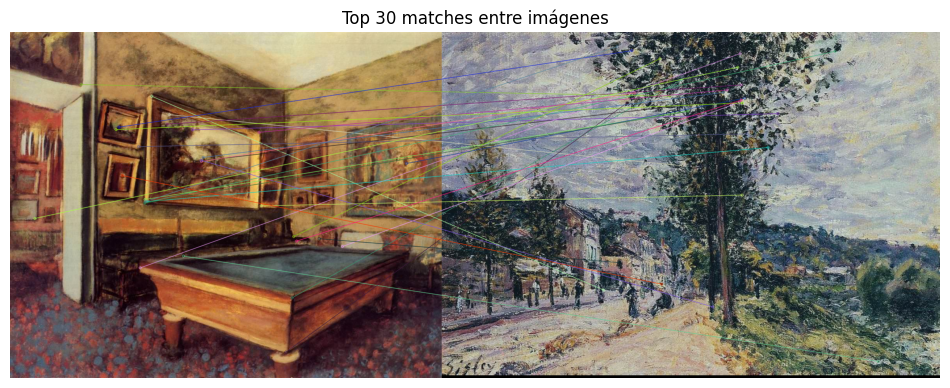

In [11]:
# --- Detección de características con ORB ---

import cv2
import os
import random
import numpy as np
import matplotlib.pyplot as plt

# Semillas para reproducibilidad
random.seed(42)
np.random.seed(42)

def detect_and_compute(detector, image_path):
    """
    Carga una imagen, la convierte a escala de grises,
    y detecta keypoints y descriptores.
    """
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"No se encontró la imagen: {image_path}")
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, des = detector.detectAndCompute(gray, None)
    return img, kp, des

def draw_keypoints(detector, image_path, max_keypoints=50):
    """
    Dibuja los keypoints más representativos en la imagen.
    """
    img, kp, _ = detect_and_compute(detector, image_path)
    # Limitar al top max_keypoints por respuesta
    kp = sorted(kp, key=lambda x: -x.response)[:max_keypoints]
    img_kp = cv2.drawKeypoints(
        img, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )
    plt.figure(figsize=(8, 8))
    plt.title(f"Keypoints en {os.path.basename(image_path)} ({len(kp)} puntos)")
    plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

def draw_matches(detector, img1_path, img2_path, nmatches=20):
    """
    Empareja características entre dos imágenes y muestra los top nmatches.
    """
    img1, kp1, des1 = detect_and_compute(detector, img1_path)
    img2, kp2, des2 = detect_and_compute(detector, img2_path)

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    match_img = cv2.drawMatches(
        img1, kp1, img2, kp2, matches[:nmatches], None, flags=2
    )
    plt.figure(figsize=(12, 6))
    plt.title(f"Top {nmatches} matches entre imágenes")
    plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

# Configuración del detector ORB
orb_detector = cv2.ORB_create(nfeatures=1000)

# Seleccionar dos artistas aleatorios
artists = sorted(os.listdir("data/Train"))
artist1, artist2 = random.sample(artists, 2)

# Tomar una imagen de cada artista
img1 = random.choice(os.listdir(os.path.join("data/Train", artist1)))
img2 = random.choice(os.listdir(os.path.join("data/Train", artist2)))

path1 = os.path.join("data/Train", artist1, img1)
path2 = os.path.join("data/Train", artist2, img2)

# Visualizar keypoints y matches
draw_keypoints(orb_detector, path1)
draw_keypoints(orb_detector, path2)
draw_matches(orb_detector, path1, path2, nmatches=30)


### 2.1: Detección de rostros con cascada Haar pre-entrenada

En este primer bloque usamos el clasificador Haar de OpenCV, que viene entrenado para detectar rostros “out-of-the-box”.  
1. Cargamos el XML de la cascada frontal (`haarcascade_frontalface_default.xml`).  
2. Elegimos aleatoriamente una pintura de `data/Train`.  
3. Convertimos a escala de grises y aplicamos `detectMultiScale`.  
4. Dibujamos rectángulos sobre los rostros detectados.  

Esta detección rápida nos servirá como línea base frente al método HOG+SVM que entrenaremos luego.  


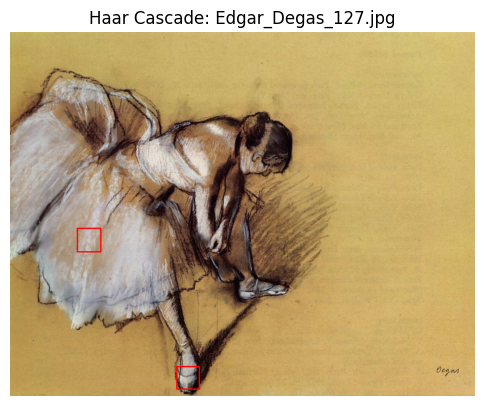

In [12]:
# — Paso 1: Detección con Haar Cascade —
import cv2, os, random
import matplotlib.pyplot as plt

# Semillas para reproducibilidad
random.seed(42)

# Carga del clasificador pre-entrenado
cascade_path = cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
face_cascade = cv2.CascadeClassifier(cascade_path)

# Elegir aleatoriamente una imagen de pintura
artists = sorted(os.listdir('data/Train'))
artist = random.choice(artists)
img_name = random.choice(os.listdir(os.path.join('data/Train', artist)))
img_path = os.path.join('data/Train', artist, img_name)

# Leer y preparar imagen
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Detectar rostros
faces = face_cascade.detectMultiScale(gray,
                                      scaleFactor=1.1,
                                      minNeighbors=5,
                                      minSize=(30, 30))

# Dibujar rectángulos
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), 2)

# Mostrar resultado
plt.figure(figsize=(6, 6))
plt.title(f'Haar Cascade: {os.path.basename(img_path)}')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


### 2.2: Preparación de datos positivos y negativos para HOG+SVM

Construimos nuestro conjunto de entrenamiento para un clasificador HOG+SVM:

1. **Positivos**: rostros reales de LFW (`fetch_lfw_people`), convertidos a escala de grises.  
2. **Negativos**: parches aleatorios extraídos de pinturas (sin rostros), usando `PatchExtractor`.  
3. Normalizamos todos los parches al mismo tamaño que los de LFW.  

De este modo podremos entrenar un SVM que aprenda a distinguir “rostro vs. no-rostro” en el estilo de las pinturas.


In [13]:
# — Paso 2: Generación de parches positivos y negativos —
from sklearn.datasets import fetch_lfw_people
from sklearn.feature_extraction.image import PatchExtractor
from skimage import io, color, transform
import numpy as np

# 2.1 Positivos (LFW)
lfw = fetch_lfw_people(color=True, resize=0.5)
pos_imgs = lfw.images  # shape (n_samples, height, width, 3)
# Convertir a gris y redimensionar a (62, 47)
pos_patches = []
for im in pos_imgs:
    gray = color.rgb2gray(im)
    patch = transform.resize(gray, (62, 47))
    pos_patches.append(patch)
pos_patches = np.array(pos_patches)

# 2.2 Negativos (pinturas)
neg_patches = []
artists = sorted(os.listdir('data/Train'))
for art in random.sample(artists, 10):            # 10 artistas aleatorios
    files = os.listdir(os.path.join('data/Train', art))
    img = io.imread(os.path.join('data/Train', art, random.choice(files)))
    gray = color.rgb2gray(img)
    extractor = PatchExtractor(patch_size=(62, 47),
                               max_patches=50,
                               random_state=42)
    patches = extractor.transform(gray[np.newaxis])
    neg_patches.extend(patches)
neg_patches = np.array(neg_patches)

print("Positivos:", pos_patches.shape)
print("Negativos:", neg_patches.shape)


Positivos: (13233, 62, 47)
Negativos: (500, 62, 47)


### 2.3: Extracción de HOG y entrenamiento de Linear SVM

Con los parches listos, extraemos descriptores HOG y entrenamos un SVM lineal:

1. Calculamos `feature.hog` para cada parche.  
2. Construimos `X` e `y`, mezclando positivos (1) y negativos (0).  
3. Dividimos en train/val y buscamos el mejor `C` con `GridSearchCV`.  
4. Guardamos el modelo óptimo para detección.


In [14]:
# — Paso 3: HOG + SVM —
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split, GridSearchCV

# 3.1 Features HOG
X_pos = [hog(p) for p in pos_patches]
X_neg = [hog(p) for p in neg_patches]
X = np.vstack((X_pos, X_neg))
y = np.hstack((np.ones(len(X_pos)), np.zeros(len(X_neg))))

# 3.2 Train/validation split
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y)

# 3.3 Búsqueda de hiperparámetro C
param_grid = {'C': [0.1, 1, 10]}
grid = GridSearchCV(LinearSVC(max_iter=10_000),
                    param_grid, cv=3, n_jobs=-1)
grid.fit(X_train, y_train)

print("Mejor CV score:", grid.best_score_)
print("Mejor C:", grid.best_params_)

svm_clf = grid.best_estimator_


Mejor CV score: 0.9956308028399782
Mejor C: {'C': 0.1}


### 2.4: Sliding-window con HOG+SVM sobre tus pinturas

Por último aplicamos un barrido (sliding-window) sobre una pintura de prueba:

1. Definimos ventana del mismo tamaño H×W (62×47).  
2. Recorremos la imagen con saltos (`step=16 px`).  
3. Para cada parche: extraemos HOG y predecimos con el SVM.  
4. Dibujamos rectángulos rojos donde el modelo detecta un “rostro”.  

> **Nota**: sin supresión de no-máximos, habrá muchas detecciones solapadas. Se puede mejorar incorporando NMS.


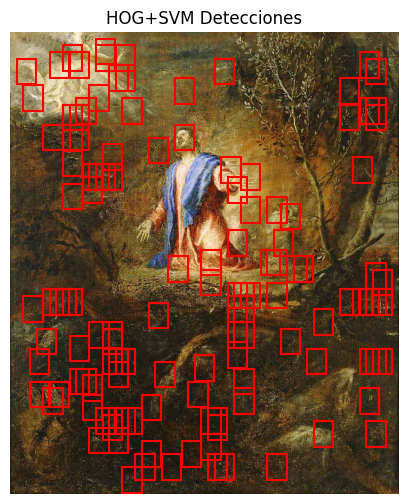

In [15]:
# — Paso 4: Detección con sliding-window HOG+SVM —
from skimage.feature import hog
from skimage import io, color
import matplotlib.patches as patches

def sliding_window(img, step=16, window_size=(62, 47)):
    H, W = img.shape
    h, w = window_size
    for y in range(0, H - h, step):
        for x in range(0, W - w, step):
            yield (x, y), img[y:y+h, x:x+w]

# Elegir una pintura de prueba
test_artist = random.choice(artists)
test_img = io.imread(os.path.join('data/Train', test_artist,
                                  random.choice(os.listdir(os.path.join('data/Train', test_artist)))))
test_gray = color.rgb2gray(test_img)

# Recorrer y predecir
detections = []
for (x, y), patch in sliding_window(test_gray):
    feat = hog(patch)
    if svm_clf.predict([feat]) == 1:
        detections.append((x, y))

# Mostrar detecciones
fig, ax = plt.subplots(1, figsize=(6, 6))
ax.imshow(test_img)
for (x, y) in detections:
    rect = patches.Rectangle((x, y), 47, 62,
                             edgecolor='red',
                             facecolor='none',
                             lw=1.5)
    ax.add_patch(rect)
ax.set_title("HOG+SVM Detecciones")
ax.axis('off')
plt.show()


### 2.5: Detección de rostros con un modelo DNN pre-entrenado (SSD+ResNet10)

Los métodos clásicos (Haar, HOG+SVM) muestran muchos falsos positivos al aplicarlos sobre pinturas, pues fueron entrenados en fotografías reales. En cambio, los detectores basados en redes neuronales profundas (DNN) capturan mejor patrones generales de “cara” y suelen generalizar más a estilos artísticos.

Aquí usaremos el modelo SSD con backbone ResNet10 proporcionado por OpenCV DNN:

1. **Descarga** automática de los ficheros `deploy.prototxt` y `res10_300x300_ssd_iter_140000_fp16.caffemodel`.  
2. **BlobFromImage** para preparar la imagen (300×300, normalización RGB).  
3. **Forward pass** en la red para obtener detecciones con sus puntuaciones (confidences).  
4. **Filtrado** por umbral (`conf > 0.5`) y dibujo de recuadros con la puntuación sobre la pintura.  

Este detector “out-of-the-box” suele ofrecer un buen compromiso entre velocidad y robustez frente a texturas y trazos artísticos.


Usando modelo fp16.


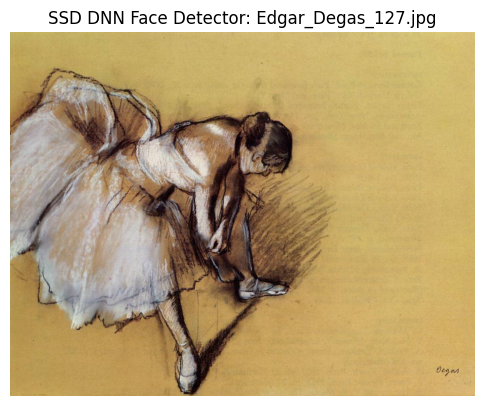

In [16]:
# — Paso 5 corregido: SSD DNN Face Detector con URLs de learnopencv/spmallick —

import os, random
from pathlib import Path

import cv2
import numpy as np
import requests
import matplotlib.pyplot as plt

# 1. Semilla para reproducibilidad
random.seed(42)

# 2. Carpeta donde guardaremos el modelo
model_dir = Path("models/face_detector")
model_dir.mkdir(parents=True, exist_ok=True)

proto_path     = model_dir / "deploy.prototxt"
model_fp16     = model_dir / "res10_300x300_ssd_iter_140000_fp16.caffemodel"
model_fp32     = model_dir / "res10_300x300_ssd_iter_140000.caffemodel"

# 3. URLs corregidas
url_proto  = "https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt"
url_fp16   = "https://raw.githubusercontent.com/spmallick/learnopencv/master/FaceDetectionComparison/models/res10_300x300_ssd_iter_140000_fp16.caffemodel"
url_fp32   = "https://raw.githubusercontent.com/spmallick/learnopencv/master/FaceDetectionComparison/models/res10_300x300_ssd_iter_140000.caffemodel"

def download_if_missing(path: Path, url: str):
    if not path.exists():
        print(f"Descargando {path.name} …")
        resp = requests.get(url, stream=True)
        resp.raise_for_status()
        path.write_bytes(resp.content)

# 4. Descarga de los ficheros
download_if_missing(proto_path, url_proto)
try:
    download_if_missing(model_fp16, url_fp16)
    model_to_load = model_fp16
    print("Usando modelo fp16.")
except requests.HTTPError:
    print("fp16 no disponible; descargando fp32…")
    download_if_missing(model_fp32, url_fp32)
    model_to_load = model_fp32
    print("Usando modelo fp32.")

# 5. Carga de la red
net = cv2.dnn.readNetFromCaffe(str(proto_path), str(model_to_load))

# 6. Seleccionar aleatoriamente una pintura de prueba
artists = sorted(os.listdir("data/Train"))
artist  = random.choice(artists)
fname   = random.choice(os.listdir(os.path.join("data/Train", artist)))
img_pth = os.path.join("data/Train", artist, fname)

# 7. Lectura y preparación de blob
img = cv2.imread(img_pth)
(h, w) = img.shape[:2]
blob = cv2.dnn.blobFromImage(
    cv2.resize(img, (300, 300)),
    1.0, (300, 300),
    (104.0, 177.0, 123.0),
    swapRB=False, crop=False
)

# 8. Forward pass y filtrado
net.setInput(blob)
detections = net.forward()

for i in range(detections.shape[2]):
    conf = float(detections[0, 0, i, 2])
    if conf > 0.5:
        box = (detections[0, 0, i, 3:7] * np.array([w, h, w, h])).astype(int)
        x1, y1, x2, y2 = box
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        y_text = y1 - 10 if y1 - 10 > 10 else y1 + 10
        cv2.putText(img, f"{conf*100:.1f}%", (x1, y_text),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# 9. Mostrar resultado
plt.figure(figsize=(6, 6))
plt.title(f"SSD DNN Face Detector: {fname}")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


### 2.6: Evaluación en lote sobre varias pinturas

Ahora que tenemos nuestro detector SSD+DNN cargado, podemos probarlo de golpe sobre varias imágenes para hacernos una idea de su rendimiento “en bruto”:

1. Definimos una función `detect_faces_ssd` que recibe un `net` y una imagen y devuelve la misma imagen con los rectángulos dibujados.  
2. Construimos una lista de rutas de imagen (aleatoria o manual).  
3. Dibujamos un **grid** de subplots (p. ej. 2×3) para visualizar varias detecciones a la vez.  
4. Ajusta el umbral de confianza (`conf_threshold`) o el tamaño del grid según las necesidades.

En este bloque veremos cómo se comporta el detector en distintas pinturas.


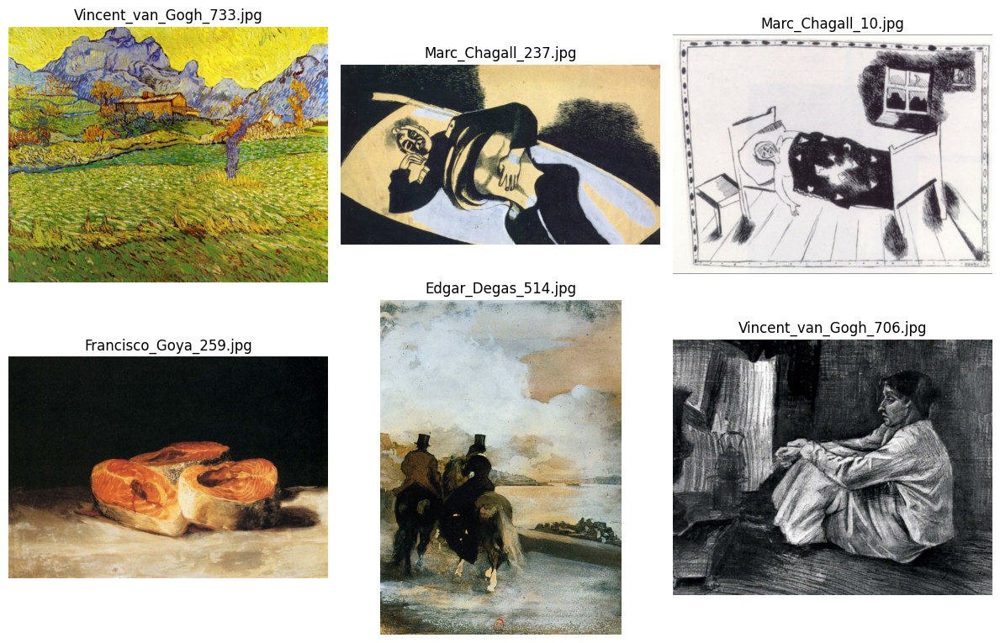

In [17]:
# — Paso 6: Prueba en lote de varias pinturas —

import os, random
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_faces_ssd(img, net, conf_threshold=0.3):
    """Dibuja rectángulos de detección sobre la imagen."""
    (h, w) = img.shape[:2]
    blob = cv2.dnn.blobFromImage(cv2.resize(img, (300, 300)),
                                 1.0, (300, 300),
                                 (104.0, 177.0, 123.0),
                                 swapRB=False, crop=False)
    net.setInput(blob)
    detections = net.forward()

    out = img.copy()
    for i in range(detections.shape[2]):
        conf = float(detections[0, 0, i, 2])
        if conf < conf_threshold:
            continue
        box = (detections[0, 0, i, 3:7] * np.array([w, h, w, h])).astype(int)
        x1, y1, x2, y2 = box
        cv2.rectangle(out, (x1, y1), (x2, y2), (0, 255, 0), 2)
        y_text = y1 - 10 if y1 - 10 > 10 else y1 + 10
        cv2.putText(out, f"{conf*100:.1f}%", (x1, y_text),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return out

# 1. Elegir N imágenes aleatorias de entrenamiento
artists = sorted(os.listdir("data/Train"))
all_paths = []
for artist in artists:
    folder = os.path.join("data/Train", artist)
    for fname in os.listdir(folder):
        all_paths.append(os.path.join(folder, fname))

sample_paths = random.sample(all_paths, 6)  # Cambia el 6 por el número que quieras

# 2. Ejecutar detección y mostrar en grid 2×3
n = len(sample_paths)
cols = 3
rows = (n + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
axes = axes.flatten()

for ax, img_path in zip(axes, sample_paths):
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    out = detect_faces_ssd(img, net, conf_threshold=0.5)
    ax.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
    ax.set_title(os.path.basename(img_path))
    ax.axis("off")

# Si hay ejes sobrantes, los ocultamos
for ax in axes[n:]:
    ax.axis("off")

plt.tight_layout()
plt.show()


### 2.7: SSD+DNN mejorado con multiescala y supresión de no-máximos

Para reducir falsos positivos y capturar caras de tamaños muy distintos, combinaremos tres mejoras:

1. **Umbral de confianza más bajo** (`conf_threshold=0.3`)  
   Para recuperar detecciones débiles que pudimos perder con `0.5`.

2. **Detección multiescala**  
   Recorremos la imagen a escalas `[0.5, 1.0, 1.5]` para encontrar rostros muy pequeños o muy grandes.

3. **Supresión de no-máximos (NMS)**  
   Una vez recogidas todas las cajas candidatas (de todas las escalas), aplicamos `cv2.dnn.NMSBoxes` con `nms_threshold=0.4` para agrupar solapamientos y quedarnos solo con las detecciones más seguras.

Con esto deberíamos obtener menos recuadros y más precisos en tus pinturas.


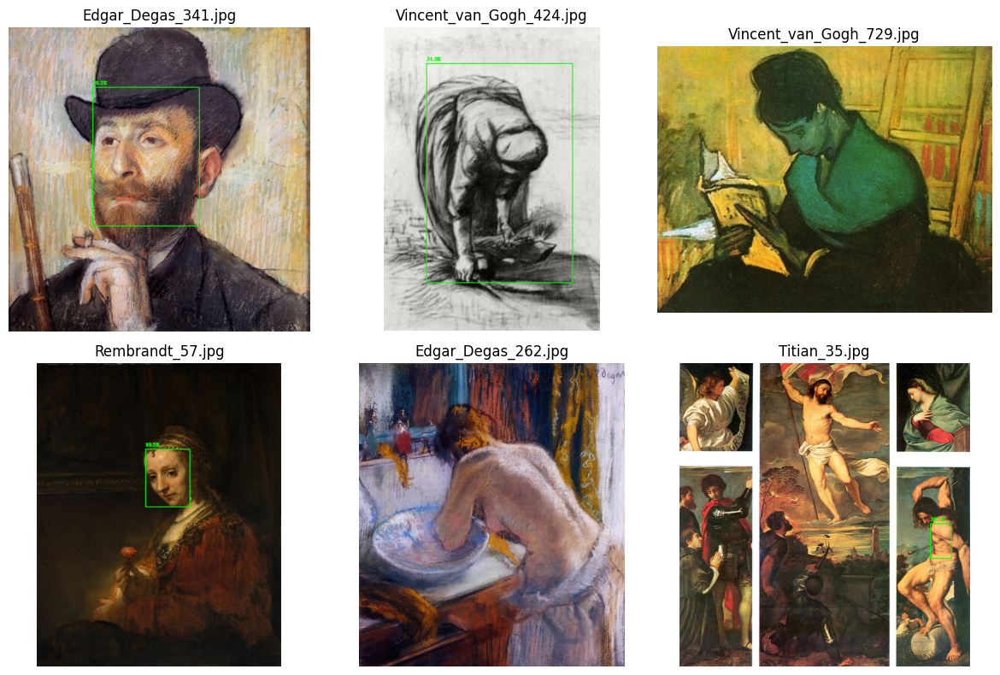

In [18]:
# — Paso 7 (fix): SSD+DNN con multiescala + NMS y aplanado de índices —

import os, random
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_faces_ssd_multiscale(img, net,
                                conf_threshold=0.3,
                                nms_threshold=0.4,
                                scales=(0.5, 1.0, 1.5)):
    H, W = img.shape[:2]
    all_boxes = []
    all_confs = []
    
    # 1) Recoger cajas de todas las escalas
    for scale in scales:
        resized = cv2.resize(img, None, fx=scale, fy=scale)
        h, w = resized.shape[:2]
        blob = cv2.dnn.blobFromImage(resized, 1.0, (300, 300),
                                     (104.0, 177.0, 123.0),
                                     swapRB=False, crop=False)
        net.setInput(blob)
        detections = net.forward()
        
        for i in range(detections.shape[2]):
            conf = float(detections[0, 0, i, 2])
            if conf < conf_threshold:
                continue
            # caja en coordenadas de la imagen redimensionada
            box = (detections[0, 0, i, 3:7] * np.array([w, h, w, h])).astype(int)
            x1, y1, x2, y2 = box
            # reescalar a tamaño original
            rx1, ry1 = int(x1/scale), int(y1/scale)
            rx2, ry2 = int(x2/scale), int(y2/scale)
            all_boxes.append([rx1, ry1, rx2 - rx1, ry2 - ry1])
            all_confs.append(conf)
    
    # 2) Supresión de no-máximos (NMS)
    if len(all_boxes) == 0:
        return img.copy()
    
    indices = cv2.dnn.NMSBoxes(all_boxes, all_confs,
                               score_threshold=conf_threshold,
                               nms_threshold=nms_threshold)
    
    # 3) Aplanar índices
    if isinstance(indices, (list, tuple)):
        # puede ser lista de int o lista de [int]
        idxs = [i[0] if isinstance(i, (list, tuple, np.ndarray)) else i for i in indices]
    else:
        # array de numpy
        idxs = indices.flatten().tolist()
    
    # 4) Dibujar cajas finales
    out = img.copy()
    for i in idxs:
        x, y, w, h = all_boxes[i]
        conf = all_confs[i]
        cv2.rectangle(out, (x, y), (x+w, y+h), (0, 255, 0), 2)
        y0 = y - 10 if y - 10 > 10 else y + 10
        cv2.putText(out, f"{conf*100:.1f}%", (x, y0),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return out

# — Visualización en 2×3 —

# Selección de 6 imágenes aleatorias
artists = sorted(os.listdir("data/Train"))
all_paths = [os.path.join("data/Train", a, f)
             for a in artists for f in os.listdir(os.path.join("data/Train", a))]
sample_paths = random.sample(all_paths, 6)

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()

for ax, path in zip(axes, sample_paths):
    img = cv2.imread(path)
    out = detect_faces_ssd_multiscale(img, net,
                                      conf_threshold=0.3,
                                      nms_threshold=0.4,
                                      scales=(0.5,1.0,1.5))
    ax.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
    ax.set_title(os.path.basename(path))
    ax.axis("off")

# Ocultar ejes sobrantes
for ax in axes[len(sample_paths):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


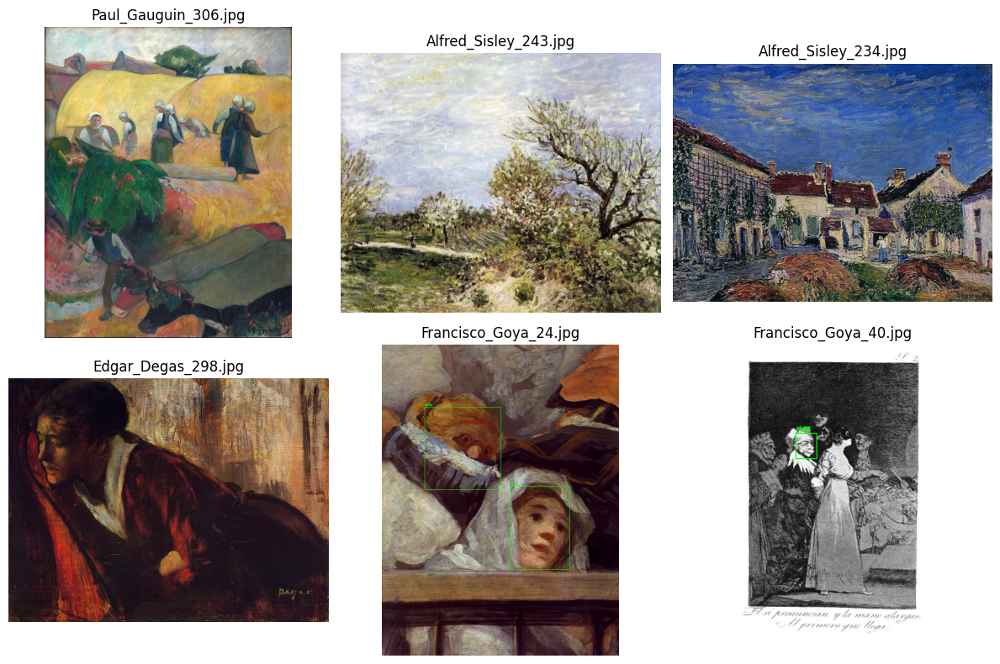

In [19]:
# — Paso 7 (fix): SSD+DNN con multiescala + NMS y aplanado de índices —

import os, random
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_faces_ssd_multiscale(img, net,
                                conf_threshold=0.3,
                                nms_threshold=0.4,
                                scales=(0.5, 1.0, 1.5)):
    H, W = img.shape[:2]
    all_boxes = []
    all_confs = []
    
    # 1) Recoger cajas de todas las escalas
    for scale in scales:
        resized = cv2.resize(img, None, fx=scale, fy=scale)
        h, w = resized.shape[:2]
        blob = cv2.dnn.blobFromImage(resized, 1.0, (300, 300),
                                     (104.0, 177.0, 123.0),
                                     swapRB=False, crop=False)
        net.setInput(blob)
        detections = net.forward()
        
        for i in range(detections.shape[2]):
            conf = float(detections[0, 0, i, 2])
            if conf < conf_threshold:
                continue
            # caja en coordenadas de la imagen redimensionada
            box = (detections[0, 0, i, 3:7] * np.array([w, h, w, h])).astype(int)
            x1, y1, x2, y2 = box
            # reescalar a tamaño original
            rx1, ry1 = int(x1/scale), int(y1/scale)
            rx2, ry2 = int(x2/scale), int(y2/scale)
            all_boxes.append([rx1, ry1, rx2 - rx1, ry2 - ry1])
            all_confs.append(conf)
    
    # 2) Supresión de no-máximos (NMS)
    if len(all_boxes) == 0:
        return img.copy()
    
    indices = cv2.dnn.NMSBoxes(all_boxes, all_confs,
                               score_threshold=conf_threshold,
                               nms_threshold=nms_threshold)
    
    # 3) Aplanar índices
    if isinstance(indices, (list, tuple)):
        # puede ser lista de int o lista de [int]
        idxs = [i[0] if isinstance(i, (list, tuple, np.ndarray)) else i for i in indices]
    else:
        # array de numpy
        idxs = indices.flatten().tolist()
    
    # 4) Dibujar cajas finales
    out = img.copy()
    for i in idxs:
        x, y, w, h = all_boxes[i]
        conf = all_confs[i]
        cv2.rectangle(out, (x, y), (x+w, y+h), (0, 255, 0), 2)
        y0 = y - 10 if y - 10 > 10 else y + 10
        cv2.putText(out, f"{conf*100:.1f}%", (x, y0),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return out

# — Visualización en 2×3 —

# Selección de 6 imágenes aleatorias
artists = sorted(os.listdir("data/Train"))
all_paths = [os.path.join("data/Train", a, f)
             for a in artists for f in os.listdir(os.path.join("data/Train", a))]
sample_paths = random.sample(all_paths, 6)

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()

for ax, path in zip(axes, sample_paths):
    img = cv2.imread(path)
    out = detect_faces_ssd_multiscale(img, net,
                                      conf_threshold=0.3,
                                      nms_threshold=0.4,
                                      scales=(0.5,1.0,1.5))
    ax.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
    ax.set_title(os.path.basename(path))
    ax.axis("off")

# Ocultar ejes sobrantes
for ax in axes[len(sample_paths):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


### 2.8: Comparación de detectores sobre un conjunto fijo de pinturas

Para evaluar de forma consistente el rendimiento de nuestros detectores (Haar, SSD+DNN mejorado y RetinaFace), seguiremos estos pasos:

1. **Selección determinística** de 6 imágenes:  
   Tomamos las primeras 6 rutas ordenadas de `data/Train/` para asegurarnos de que todos los métodos trabajen sobre las mismas pinturas en cada ejecución.

2. **Definición de funciones de detección**:  
   - **Haar Cascade** (baseline).  
   - **SSD+DNN multiescala + NMS** (mejorado).  
   - **RetinaFace** (modelo DNN ligero que generaliza bien a estilos artísticos).

3. **Visualización en grid** con 3 columnas: cada columna muestra el resultado de un detector sobre cada imagen:
   - Columna 1: Haar Cascade (recuadros rojos)  
   - Columna 2: SSD+DNN multiescala + NMS (recuadros verdes)  
   - Columna 3: RetinaFace (recuadros azules)

Así podremos comparar visualmente las fortalezas y debilidades de cada aproximación.


#### 2.8.1 (alternativa): Filtrado de imágenes con paso previo de detección de rostros usando Mediapipe

Como Haar falla en pinturas y SSD+DNN multiescala puede no detectar algunos rostros, usaremos **Mediapipe Face Detection** —más robusto y ligero— para preseleccionar automáticamente seis pinturas que sí contienen al menos un rostro detectable:

1. Definimos `has_face_mp(path)` que carga la imagen, la procesa con Mediapipe y devuelve `True` si encuentra ≥1 detección.  
2. Recorremos todas las rutas en `data/Train/`, filtrando sólo aquellas con detección.  
3. Tomamos las primeras 6 para `sample_paths`.  
4. Usaremos luego esas rutas fijas en el bloque comparativo.

Así garantizamos rostros visibles para evaluar los tres detectores de forma justa.


In [20]:
# — Paso 8.1 (alternativa): Pre-filtrado con Mediapipe Face Detection —

import os
import cv2
import random
import mediapipe as mp

# Inicializar Mediapipe Face Detection (mismo objeto que en tu comparativa)
mp_fd = mp.solutions.face_detection
fd = mp_fd.FaceDetection(model_selection=1, min_detection_confidence=0.3)

def has_face_mp(img_path):
    """
    Devuelve True si Mediapipe detecta al menos un rostro en la imagen.
    """
    img = cv2.imread(img_path)
    if img is None:
        return False
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = fd.process(img_rgb)
    return bool(results.detections)

# Construir lista de todas las rutas
artists = sorted(os.listdir("data/Train"))
all_paths = [
    os.path.join("data/Train", artist, fname)
    for artist in artists
    for fname in sorted(os.listdir(os.path.join("data/Train", artist)))
]

# Filtrar sólo las que tienen rostro según Mediapipe
valid_paths = [p for p in all_paths if has_face_mp(p)]
print(f"Total con rostro detectado (Mediapipe): {len(valid_paths)}")

# Seleccionar las primeras 6
if len(valid_paths) < 6:
    raise RuntimeError("Menos de 6 imágenes con rostros detectables por Mediapipe.")
sample_paths = valid_paths[:6]
print("Usando estas 6 imágenes para la comparativa:")
for p in sample_paths:
    print(" •", p)


Total con rostro detectado (Mediapipe): 863
Usando estas 6 imágenes para la comparativa:
 • data/Train\Alfred_Sisley\Alfred_Sisley_78.jpg
 • data/Train\Edgar_Degas\Edgar_Degas_1.jpg
 • data/Train\Edgar_Degas\Edgar_Degas_111.jpg
 • data/Train\Edgar_Degas\Edgar_Degas_119.jpg
 • data/Train\Edgar_Degas\Edgar_Degas_13.jpg
 • data/Train\Edgar_Degas\Edgar_Degas_134.jpg


In [21]:
import mediapipe as mp

# Crear detector de caras de MediaPipe
mp_face_detection = mp.solutions.face_detection
mp_drawing = mp.solutions.drawing_utils

def detect_mediapipe(img_bgr):
    """
    Detección de rostros con MediaPipe (FaceDetection).
    Devuelve imagen con recuadros azules sobre los rostros detectados.
    """
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    out_img = img_bgr.copy()

    with mp_face_detection.FaceDetection(model_selection=1, min_detection_confidence=0.5) as face_detection:
        results = face_detection.process(img_rgb)
        if results.detections:
            for detection in results.detections:
                bboxC = detection.location_data.relative_bounding_box
                ih, iw, _ = out_img.shape
                x = int(bboxC.xmin * iw)
                y = int(bboxC.ymin * ih)
                w = int(bboxC.width * iw)
                h = int(bboxC.height * ih)
                cv2.rectangle(out_img, (x, y), (x + w, y + h), (255, 0, 0), 2)

    return out_img


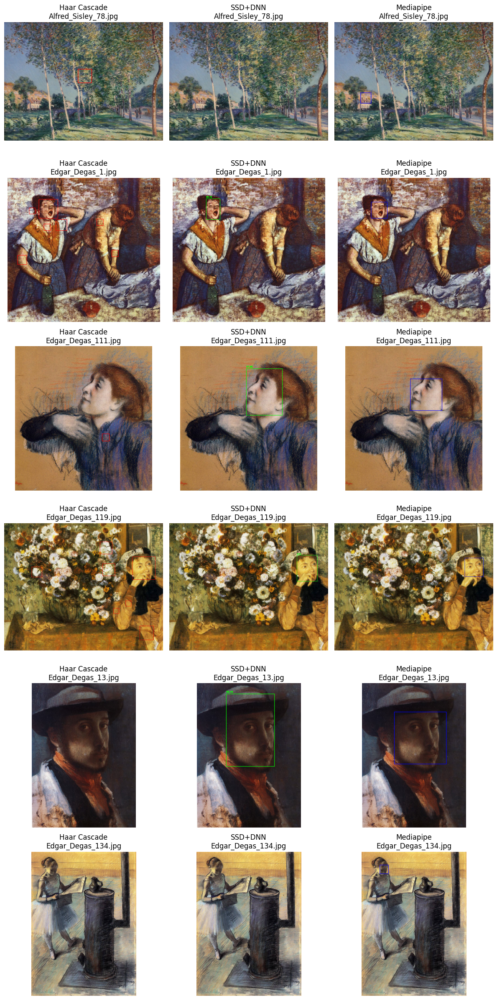

In [22]:
# — Paso 8.2: Comparativa definitiva con sample_paths prefiltrado —

# 1) Imports (asegúrate de haber ejecutado los pasos previos que definen face_cascade, net y fd)
import cv2
import matplotlib.pyplot as plt

# 2) sample_paths debe venir del Paso 8.1; no lo redefinimos aquí
#    (si no existe, ejecuta antes el bloque que filtra con has_face_mp)

# 3) Grid comparativo (6 filas × 3 columnas)
fig, axes = plt.subplots(len(sample_paths), 3, figsize=(12, len(sample_paths)*4))

for i, img_path in enumerate(sample_paths):
    img_bgr = cv2.imread(img_path)

    # A) Haar Cascade (rojo)
    out_haar = img_bgr.copy()
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.1, 5, minSize=(30,30))
    for (x, y, w, h) in faces:
        cv2.rectangle(out_haar, (x, y), (x+w, y+h), (0, 0, 255), 2)
    out_haar = cv2.cvtColor(out_haar, cv2.COLOR_BGR2RGB)

    # B) SSD+DNN multiescala + NMS (verde)
    out_ssd = detect_faces_ssd_multiscale(
        img_bgr, net,
        conf_threshold=0.3,
        nms_threshold=0.4,
        scales=(0.5, 1.0, 1.5)
    )
    out_ssd = cv2.cvtColor(out_ssd, cv2.COLOR_BGR2RGB)

    # C) Mediapipe Face Detection (azul)
    out_mp = detect_mediapipe(img_bgr)
    out_mp = cv2.cvtColor(out_mp, cv2.COLOR_BGR2RGB)

    # Mostrar fila
    for j, out in enumerate([out_haar, out_ssd, out_mp]):
        ax = axes[i, j]
        ax.imshow(out)
        title = ["Haar Cascade", "SSD+DNN", "Mediapipe"][j]
        ax.set_title(f"{title}\n{os.path.basename(img_path)}")
        ax.axis("off")

plt.tight_layout()
plt.show()


---
## 3. Análisis comparativo entre estilos pictóricos


En esta sección se seleccionan tres cuadros representativos de diferentes estilos para aplicar técnicas de visión por computador:

- **Vincent van Gogh** (impresionismo / postimpresionismo)
- **Pablo Picasso** (cubismo)
- **Francisco Goya** (realismo / romanticismo)

Sobre cada uno de estos cuadros se aplicarán tres técnicas:
1. **Detección de objetos** con un modelo YOLOv5 preentrenado
2. **Detección de rostros** mediante clasificadores Haar Cascade
3. **Detección de bordes y líneas** con los algoritmos de Canny y Hough

El objetivo es observar cómo responde cada técnica visual ante estilos pictóricos muy distintos, comentando sus fortalezas y limitaciones.



In [23]:
from PIL import Image
import os

# Cuadros seleccionados desde el dataset definitivo (data/Train)
cuadros = {
    'Van_Gogh': 'data/Train/Vincent_van_Gogh/Vincent_van_Gogh_8.jpg',
    'Picasso': 'data/Train/Pablo_Picasso/Pablo_Picasso_24.jpg',
    'Goya': 'data/Train/Francisco_Goya/Francisco_Goya_22.jpg'
}


### 3.1 Detección de objetos con YOLOv5

A continuación se aplica un modelo YOLOv5 preentrenado (entrenado sobre el conjunto COCO) para detectar objetos comunes en los cuadros seleccionados.

Este modelo es capaz de identificar 80 clases diferentes como personas, animales, instrumentos, etc., pero está entrenado sobre imágenes reales, por lo que su rendimiento en obras artísticas dependerá del estilo visual de cada pintor.

Se analiza cómo responde YOLOv5 ante:
- El trazo expresivo y el color de **Van Gogh**
- Las figuras geométricas del **cubismo de Picasso**
- El dramatismo y realismo visual en la obra de **Goya**


Using cache found in C:\Users\alber/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2025-5-6 Python-3.12.2 torch-2.2.2+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 



🖼️ Cuadro de Van_Gogh


image 1/1: 640x640 3 boats, 1 horse
Speed: 11.8ms pre-process, 194.8ms inference, 12.7ms NMS per image at shape (1, 3, 640, 640)


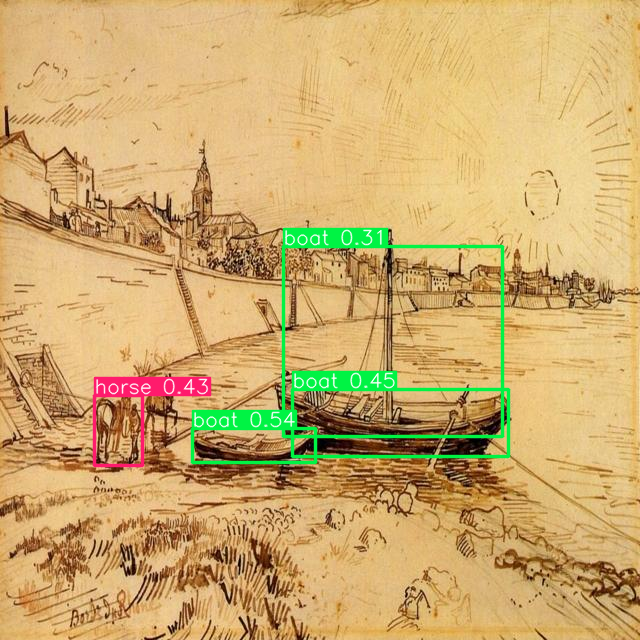


🖼️ Cuadro de Picasso


image 1/1: 640x640 1 person, 1 wine glass, 1 vase
Speed: 11.7ms pre-process, 183.4ms inference, 2.0ms NMS per image at shape (1, 3, 640, 640)


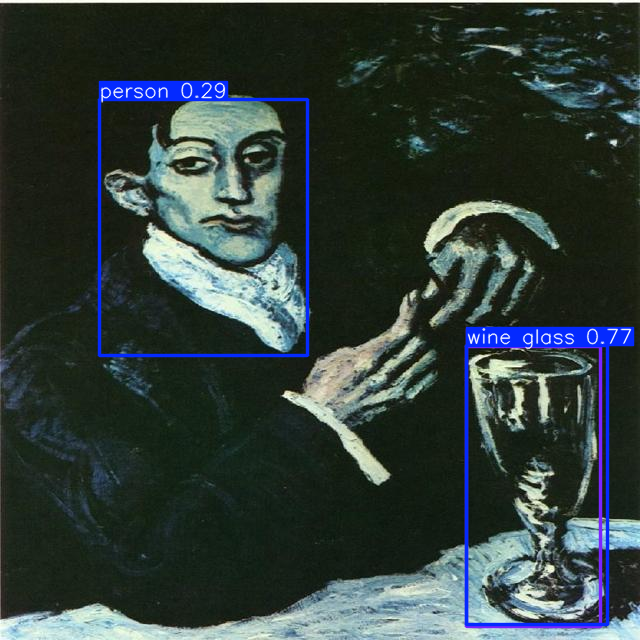

image 1/1: 640x640 1 person, 1 horse
Speed: 5.9ms pre-process, 159.5ms inference, 2.0ms NMS per image at shape (1, 3, 640, 640)



🖼️ Cuadro de Goya


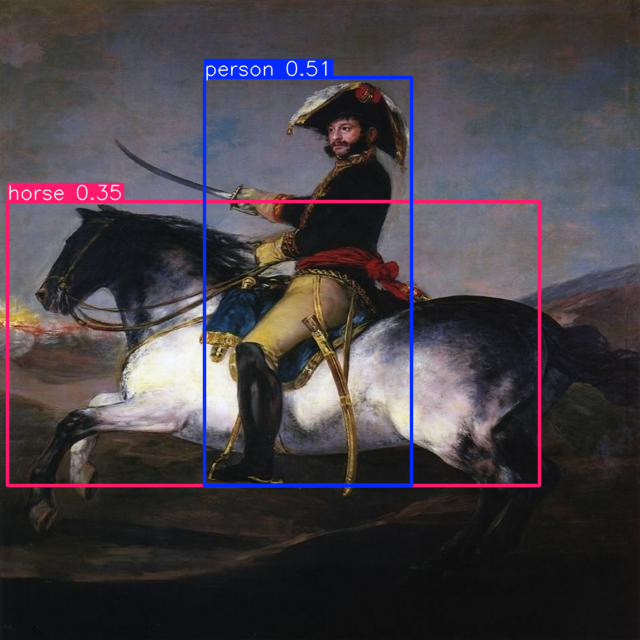

In [24]:
import torch

# Cargar YOLOv5 preentrenado
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

# Función para aplicar detección
def detectar_y_mostrar_yolo(img_path):
    if not os.path.exists(img_path):
        print(f"No se encuentra la imagen: {img_path}")
        return
    resized = Image.open(img_path).resize((640, 640))
    temp_path = 'temp_resized.jpg'
    resized.save(temp_path)

    results = model(temp_path)
    results.print()
    results.show()

# Aplicar detección a los tres cuadros
for artista, ruta in cuadros.items():
    print(f"\n🖼️ Cuadro de {artista}")
    detectar_y_mostrar_yolo(ruta)


#### Análisis de resultados — Detección de objetos con YOLOv5

**1. Van Gogh (impresionismo / dibujo a tinta)**  
En este caso, la imagen corresponde a una obra de Van Gogh realizada con líneas a tinta. Pese a no estar coloreada ni tener volumen realista, el modelo detecta varios "boats" (barcos) y un "horse" con confianza media (entre 0.3 y 0.5). Esto sugiere que YOLOv5, entrenado con imágenes reales, aún puede encontrar estructuras reconocibles gracias a la claridad del dibujo. Sin embargo, las probabilidades son bajas, y podrían generar falsos positivos si los trazos fueran más abstractos.

**2. Picasso (cubismo)**  
La obra cubista de Picasso presenta rostros deformados y trazos estilizados. El modelo detecta un "person" (0.29) y un "wine glass" (0.77). El vaso es detectado con alta confianza por su forma definida, pero la cara humana solo con una confianza baja. Esto es coherente, ya que el cubismo rompe la estructura anatómica, dificultando la detección de objetos habituales.

**3. Goya (realismo / romanticismo)**  
Aquí se observa el mejor resultado. YOLOv5 detecta con claridad un "person" (0.51) y un "horse" (0.35). Ambas clases son reconocibles y aparecen en contextos similares a los del conjunto de entrenamiento de COCO. La pintura de Goya mantiene proporciones, sombras y volumen que facilitan la identificación, a pesar de ser una obra artística.

**Conclusión general:**  
El rendimiento de YOLOv5 mejora claramente cuando las formas representadas se aproximan más al mundo real, como en el caso de Goya. En estilos como el cubismo o el dibujo a tinta, el modelo sigue siendo capaz de detectar algunos objetos, pero con menor confianza y más sensibilidad a la forma y color.


### 3.2 Detección de rostros con Haar Cascade

La detección de rostros se realiza utilizando un clasificador Haar Cascade preentrenado de OpenCV.

Este método clásico detecta patrones visuales que suelen formar un rostro (ojos, nariz, contorno) y funciona bien con imágenes reales. Sin embargo, su rendimiento puede verse afectado por estilos artísticos no realistas o deformaciones propias de movimientos como el cubismo.

Se analiza su comportamiento en tres cuadros de estilos muy diferentes:
- **Van Gogh**: trazo expresivo y rostro reconocible
- **Picasso**: distorsión geométrica del cubismo
- **Goya**: representación realista


In [25]:
%matplotlib inline



🧑‍🎨 Cuadro de Van_Gogh


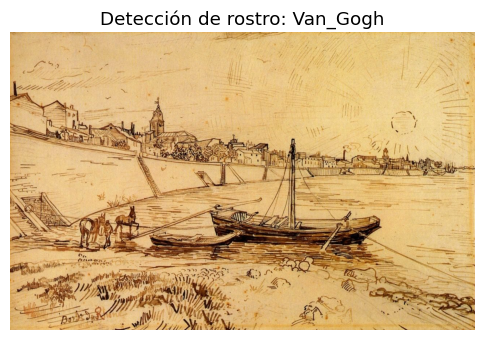


🧑‍🎨 Cuadro de Picasso


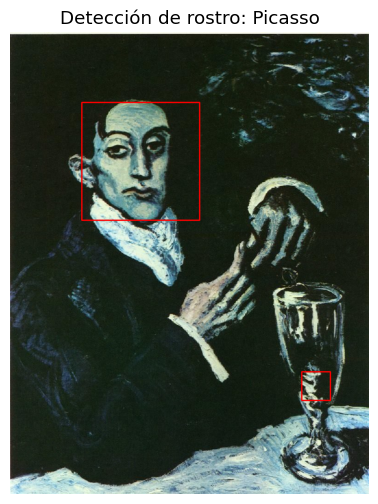


🧑‍🎨 Cuadro de Goya


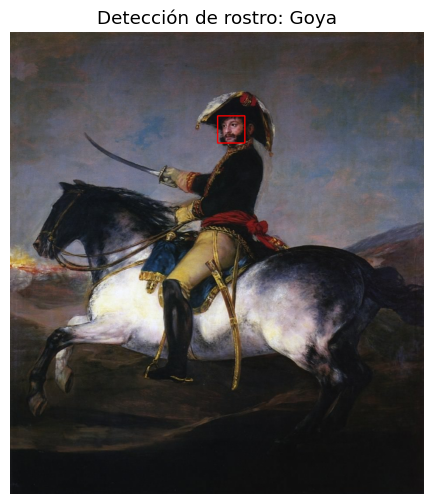

In [26]:
import cv2
import matplotlib.pyplot as plt

# Cargar el clasificador Haar Cascade preentrenado
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

def detectar_rostros_haar(img_path):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        print(f"No se pudo cargar la imagen: {img_path}")
        return None

    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(img_gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    for (x, y, w, h) in faces:
        cv2.rectangle(img_bgr, (x, y), (x + w, y + h), (0, 0, 255), 2)

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb


# Aplicar detección de rostro a los tres cuadros
for artista, ruta in cuadros.items():
    print(f"\n🧑‍🎨 Cuadro de {artista}")
    imagen = detectar_rostros_haar(ruta)
    if imagen is not None:
        plt.figure(figsize=(6, 6))
        plt.imshow(imagen)
        plt.title(f"Detección de rostro: {artista}")
        plt.axis("off")
        plt.show()

#### Análisis de resultados — Detección de rostros con Haar Cascade

**1. Van Gogh (impresionismo / dibujo a tinta)**  
En este caso, no se ha detectado ningún rostro. La obra es un dibujo de líneas con escaso detalle facial, y las figuras humanas están representadas a escala pequeña y sin contraste. Esto dificulta enormemente la detección por parte del clasificador Haar Cascade, que se basa en patrones visuales específicos (ojos, nariz, boca) sobre imágenes en escala de grises.

**2. Picasso (cubismo temprano / retrato)**  
Se ha detectado correctamente un rostro, a pesar del estilo estilizado de la pintura. El retrato presenta una cara frontal con ojos, nariz y boca claramente definidos, lo cual facilita que Haar Cascade lo reconozca como un rostro humano. Sin embargo, también se ha producido un falso positivo sobre la copa, que ha sido marcada por error como un posible rostro, probablemente por sus líneas curvas simétricas.

**3. Goya (realismo / romanticismo)**  
El rostro del jinete es detectado de forma precisa. La pintura tiene un alto nivel de realismo, volumen, contraste facial y proporciones humanas, lo cual encaja bien con lo que espera el clasificador Haar.


### 3.3 Detección de bordes y líneas (Canny + Hough)

En esta sección se aplican dos técnicas clásicas de visión por computador:

- **Detector de bordes de Canny**: resalta los contornos en la imagen donde hay cambios bruscos de intensidad.
- **Transformada de Hough**: detecta líneas rectas a partir de los bordes encontrados.

Ambas técnicas funcionan bien con imágenes con formas claras y contrastes definidos, pero pueden verse afectadas por el trazo suelto, la textura pictórica o la abstracción del estilo.

Se analiza su comportamiento en:
- El trazo nervioso de **Van Gogh**
- Las formas descompuestas de **Picasso**
- Las figuras detalladas y realistas de **Goya**



📏 Análisis de bordes en obra de Van_Gogh


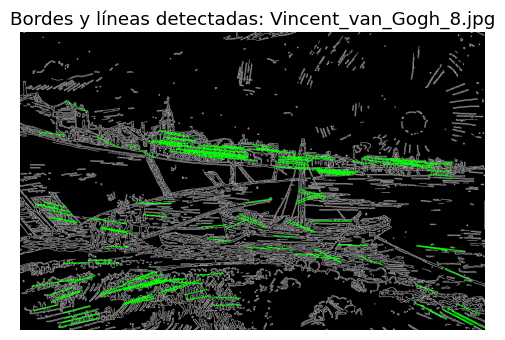


📏 Análisis de bordes en obra de Picasso


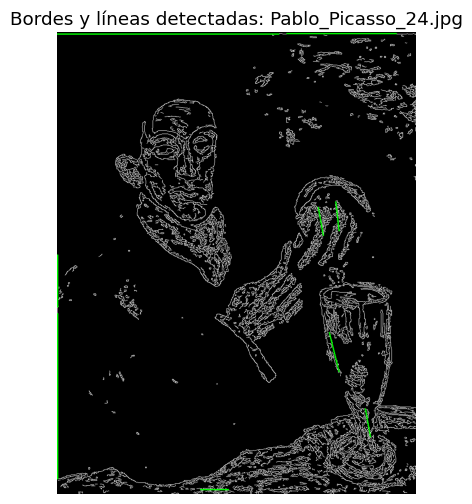


📏 Análisis de bordes en obra de Goya


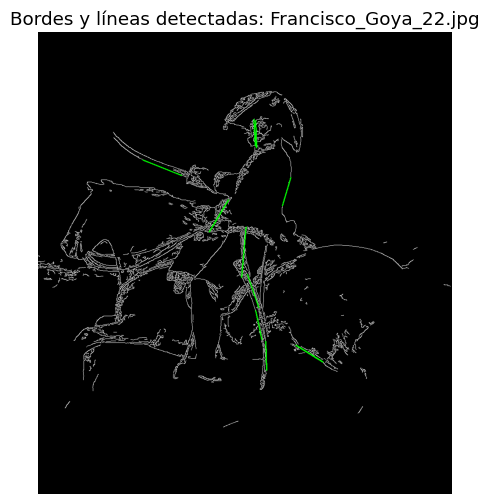

In [27]:
def detectar_bordes_y_lineas(img_path):
    img = cv2.imread(img_path)
    if img is None:
        print(f"No se pudo cargar la imagen: {img_path}")
        return

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 100, 200)

    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=100, minLineLength=60, maxLineGap=5)
    img_lines = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)

    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(img_lines, (x1, y1), (x2, y2), (0, 255, 0), 2)

    img_rgb = cv2.cvtColor(img_lines, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(img_rgb)
    plt.title(f"Bordes y líneas detectadas: {os.path.basename(img_path)}")
    plt.axis("off")
    plt.show()

# Aplicar a cada uno de los tres cuadros
for artista, ruta in cuadros.items():
    print(f"\n📏 Análisis de bordes en obra de {artista}")
    detectar_bordes_y_lineas(ruta)


#### Análisis de resultados — Detección de bordes y líneas (Canny + Hough)

**1. Van Gogh (impresionismo / dibujo lineal)**  
El resultado muestra una gran cantidad de líneas detectadas. Al tratarse de una obra a tinta con trazo claro, la detección de bordes mediante Canny funciona especialmente bien, captando contornos arquitectónicos, estructuras del puerto y elementos del paisaje. La Transformada de Hough también logra detectar muchas líneas rectas (en verde), especialmente en los barcos, la línea del agua y construcciones. Este estilo basado en contorno y estructura favorece a este tipo de análisis.

**2. Picasso (cubismo temprano)**  
Aunque se detectan bordes definidos, la Transformada de Hough detecta pocas líneas rectas. Esto es coherente con el estilo de la obra, en la que predominan curvas estilizadas, formas suaves y deformación anatómica. Los bordes son abundantes, pero su disposición no favorece la aparición de líneas bien definidas, lo que limita la eficacia de la detección de estructuras lineales.

**3. Goya (realismo / composición dinámica)**  
En la obra de Goya se detectan líneas principales que marcan la postura del jinete, la espada y partes del caballo. Aunque la imagen contiene muchos bordes suaves (difuminados por el uso pictórico de la luz), Canny logra extraer una buena cantidad de información estructural, y Hough detecta algunas líneas relevantes, aunque menos que en el dibujo de Van Gogh. Este resultado es intermedio: hay contraste suficiente para trabajar, pero no tanta claridad como en un dibujo a tinta.

**Conclusión general:**  
La detección de bordes y líneas responde especialmente bien en imágenes con contornos definidos, como dibujos o grabados. En estilos pictóricos más suaves o con formas curvas (cubismo o realismo pictórico), la extracción de líneas rectas es más limitada, aunque los bordes aún permiten capturar información útil.

---
## 4. Conclusiones finales del análisis visual comparativo

A lo largo del análisis se han aplicado tres técnicas de visión por computador sobre obras de tres pintores de estilos muy diferentes: **Van Gogh**, **Picasso** y **Goya**. Estas técnicas han sido:

- **YOLOv5 para detección de objetos**
- **Haar Cascade para detección de rostros**
- **Canny + Hough para detección de bordes y líneas**

Los resultados muestran claramente cómo el rendimiento de los modelos varía según el grado de realismo, claridad estructural y proporciones anatómicas del estilo artístico:

- **YOLOv5** funciona mejor con estilos figurativos y realistas como el de Goya, donde detecta personas y caballos con confianza moderada. En el dibujo a tinta de Van Gogh también es eficaz, al haber formas bien definidas. Sin embargo, en la obra de Picasso, más abstracta, solo identifica objetos con baja confianza.

- **Haar Cascade** muestra un comportamiento similar: detecta rostros con facilidad en estilos realistas (Goya) o moderadamente estilizados (Picasso), pero falla completamente en escenas sin rostros nítidos o con figuras demasiado esquemáticas (Van Gogh).

- **La combinación de Canny + Hough** es especialmente eficaz en obras con líneas bien marcadas, como el dibujo de Van Gogh. En Picasso y Goya se detectan bordes útiles, pero la aparición de líneas rectas disminuye debido a la complejidad de los trazos y al estilo pictórico.

**En resumen**, los modelos de visión por computador actuales, entrenados sobre imágenes del mundo real, pueden extraer información relevante incluso de obras de arte, pero su eficacia depende fuertemente del estilo visual. Este análisis permite reflexionar sobre cómo los algoritmos "ven" el arte y cuáles son sus límites frente a la percepción humana.
